# Окончательный вариант парсинга

# подготовка к парсингу

In [1]:
import pandas as pd
import numpy as np
import requests
from bs4 import BeautifulSoup as bs
import re
from tqdm.notebook import trange, tqdm
from tqdm.gui import tqdm as tqdm_gui
from IPython.display import display
import datetime as dt
import seaborn as sns
import matplotlib.pyplot as plt

импорт библиотек

In [2]:
import warnings
warnings.filterwarnings('ignore')

отключение ворнингов

In [3]:
pd.set_option('display.max_colwidth', 1000)
pd.set_option('display.max_columns', 1000)
pd.set_option('display.max_rows', 1000)

задание параметров таблиц

In [4]:
def find_id(x):
    xxx = x.find('span', class_="ty-control-group__item").text  
    return xxx

функция создания столбца с кодом товара

In [5]:
def find_availability(t):
    xxx = (t.find('a', class_="ty-control-group product-list-field cm-external-click")
           .text.replace('\ue924','').replace('\ue86c','').replace('\n',''))
    return xxx  

функция создания столбца с парсингом наличия товара

In [6]:
def find_title(t):
    xxx = t.find('a', class_="product-title").text
    return xxx

функция создающая столбец с названием товара

In [7]:
def find_price(t):
    xxx = t.find('span', class_="ty-price-num").text.replace(u'\xa0',u'')
    return xxx

функция создающая столбец с продажной ценой товара

In [8]:
def find_old_price(t):
    try:
        xxx = t.find('span', class_="ty-strike").text.replace(u'\xa0',u'').replace(u'руб',u'')
        return xxx
    except:
        return np.NaN

функция созжающая столбец с предидущей ценой для акционного товара

In [9]:
def find_url(t):
    xxx = t.find('a', class_="abt-single-image")['href']
    return xxx

Функция создающая столбец с урл адресом товара

In [10]:
def preprocessing(x):
    print(f'таблица имеет следующий вид:')
    display(x.head())
    print('*'*100)
    print(f'таблица имеет {x.shape[0]} сторок и {x.shape[1]} столбцов')
    print('*'*100)
    print(f'в таблице обнаружено дублекатов:{x.duplicated().sum()}')
    print('*'*100)
    print('в таблице обнаружены пропуски в следующих столбцах:')
    display(x.isna().sum())
    print('*'*100)
    print('Эти пропуски составлябт следующее количество в процентах')
    display((x.isna().mean()* 100).round(1))
    print('*'*100)
    print('столбцы имеют следующие типы:')
    display(x.dtypes)
    x.columns = [y.lower().replace(' ', '_') for y in x.columns.values] 
    print('*'*100)
    print('названия столбцов переписаны в нижнем регистре, пробелы заменены на нижнее подчеркивание')
    print('*'*100)
    display(x.info())

Функция для проверки датафрейма(вид дублекаты пропуски)

In [11]:
def parsing_2(url):
    data = pd.DataFrame(columns=['url', 'id', 'date', 'availability', 'title', 'price', 'old_price'])
    for i in tqdm(url):        
        q = 1
        while q>0:        
            reqx = requests.get(i + str(q))
            soup = bs(reqx.text, 'html.parser')
            datax = pd.DataFrame({'url':pd.Series(soup.findAll('div', class_='ypi-grid-list__item_body'),dtype = 'object')})
            data = pd.concat([data, datax], ignore_index=True)
            if len(list(soup.findAll('div', class_='ypi-grid-list__item_body'))) > 0:
                q = q + 1
            else:
                q = 0
    data['id'] = data['url'].apply(find_id)
    data['date'] = pd.to_datetime('today').normalize()
    data['availability'] = data['url'].apply(find_availability)
    data['title'] = data['url'].apply(find_title)
    data['price'] = data['url'].apply(find_price)
    data['old_price'] = data['url'].apply(find_old_price)
    data['url'] = data['url'].apply(find_url)
    data['price'] = data['price'].astype(float)
    data.loc[data['old_price'] == '','old_price'] = np.nan
    data['old_price'] = data['old_price'].astype(float)
    return data

Функция предварительного парсинга сайта, которая проходит по всем страницам в урл адресах переменной `all_url` и создает датафрейм в котором храняться: урл адреса товаров, индентефикатор товаров, дата предварительного парсинга товара, наличия товара, названия товара, цены товара, старой цены для акционного товара.

# Парсинг цен кодов товара и url

In [12]:
all_url = ['https://hi-tech.md/televizory-i-elektronika/page-',
           'https://hi-tech.md/bytovaya-tehnika/page-',
           'https://hi-tech.md/kompyuternaya-tehnika/page-',
           'https://hi-tech.md/mebel-tekstil/kompyuternaya-mebel/ofisnye-kresla-i-stulya/komp.-kresla/page-',
           'https://hi-tech.md/instrumenty-i-oborudovanie/elektroinstrument/page-',
           'https://hi-tech.md/tovary-dlya-doma/page-'
          ]

all_url = ['https://hi-tech.md/televizory-i-elektronika/page-']

all_url = ['https://hi-tech.md/bytovaya-tehnika/page-']

all_url = ['https://hi-tech.md/kompyuternaya-tehnika/page-']

all_url = ['https://hi-tech.md/mebel-tekstil/kompyuternaya-mebel/ofisnye-kresla-i-stulya/komp.-kresla/page-']

all_url = ['https://hi-tech.md/instrumenty-i-oborudovanie/elektroinstrument/page-']

all_url = ['https://hi-tech.md/tovary-dlya-doma/page-']

переменная со списком ссылок на сайт для парсинга

In [13]:
df = parsing_2(all_url)
df

  0%|          | 0/6 [00:00<?, ?it/s]

,url,id,date,availability,title,price,old_price
0,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-cr1220-01/,Т-000088228,2024-06-23,В наличии,Батарейка Energenie EG-BA-CR1220-01,4.0,NaN
1,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-cr2016-01/,Т-000088229,2024-06-23,В наличии,Батарейка Energenie EG-BA-CR2016-01,4.0,NaN
2,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-aa4-01/,Т-000088221,2024-06-23,В наличии,Батарейка Energenie EG-BA-AA4-01,5.0,NaN
3,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-aaa4-01/,Т-000088222,2024-06-23,В наличии,Батарейка Energenie EG-BA-AAA4-01,5.0,NaN
4,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-cr2025-01/,Т-000088230,2024-06-23,В наличии,Батарейка Energenie EG-BA-CR2025-01,5.0,NaN
...,...,...,...,...,...,...,...
9313,https://hi-tech.md/tovary-dlya-doma/osveschenie/lyustry/lyustra-4pl-satipo-transparent-led15w-e27-5628-tkl/,Т-000085036,2024-06-23,В наличии,Люстра 4PL SATIPO TRANSPARENT LED15W E27 (5628) (TKL),3279.0,4099.0
9314,https://hi-tech.md/tovary-dlya-doma/osveschenie/lyustry/lyustra-4pl-satipo-amber-led15w-e27-5625-tkl/,Т-000085037,2024-06-23,В наличии,Люстра 4PL SATIPO AMBER LED15W E27 (5625) (TKL),3311.0,4139.0
9315,https://hi-tech.md/tovary-dlya-doma/osveschenie/lyustry/lyustra-3pl-universo-black-led15w-e27-4483-tkl/,Т-000085021,2024-06-23,В наличии,Люстра 3PL UNIVERSO BLACK LED15W E27 (4483) (TKL),3359.0,4199.0
9316,https://hi-tech.md/tovary-dlya-doma/osveschenie/lyustry/lyustra-6pl-fairy-black-6w-g9-4856-tkl/,Т-000085033,2024-06-23,В наличии,Люстра 6PL FAIRY BLACK 6W G9 (4856) (TKL),3471.0,4339.0


предварительный парсинг

In [14]:
df = df.drop_duplicates().reset_index(drop=True)

удаление дублекатов

In [15]:
df.to_csv('csv/hi_tech_test_'+dt.datetime.now().strftime('%Y_%m_%d')+'.csv', index=False)

создание резервной копии парсинга данных

In [16]:
df = pd.read_csv('csv/hi_tech_test_'+dt.datetime.now().strftime('%Y_%m_%d')+'.csv')

In [17]:
preprocessing(df)

таблица имеет следующий вид:


,url,id,date,availability,title,price,old_price
0,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-cr1220-01/,Т-000088228,2024-06-23,В наличии,Батарейка Energenie EG-BA-CR1220-01,4.0,NaN
1,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-cr2016-01/,Т-000088229,2024-06-23,В наличии,Батарейка Energenie EG-BA-CR2016-01,4.0,NaN
2,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-aa4-01/,Т-000088221,2024-06-23,В наличии,Батарейка Energenie EG-BA-AA4-01,5.0,NaN
3,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-aaa4-01/,Т-000088222,2024-06-23,В наличии,Батарейка Energenie EG-BA-AAA4-01,5.0,NaN
4,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-cr2025-01/,Т-000088230,2024-06-23,В наличии,Батарейка Energenie EG-BA-CR2025-01,5.0,NaN


****************************************************************************************************
таблица имеет 8753 сторок и 7 столбцов
****************************************************************************************************
в таблице обнаружено дублекатов:0
****************************************************************************************************
в таблице обнаружены пропуски в следующих столбцах:


url                0
id                 0
date               0
availability       0
title              0
price              0
old_price       6555
dtype: int64

****************************************************************************************************
Эти пропуски составлябт следующее количество в процентах


url              0.0
id               0.0
date             0.0
availability     0.0
title            0.0
price            0.0
old_price       74.9
dtype: float64

****************************************************************************************************
столбцы имеют следующие типы:


url              object
id               object
date             object
availability     object
title            object
price           float64
old_price       float64
dtype: object

****************************************************************************************************
названия столбцов переписаны в нижнем регистре, пробелы заменены на нижнее подчеркивание
****************************************************************************************************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8753 entries, 0 to 8752
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   url           8753 non-null   object 
 1   id            8753 non-null   object 
 2   date          8753 non-null   object 
 3   availability  8753 non-null   object 
 4   title         8753 non-null   object 
 5   price         8753 non-null   float64
 6   old_price     2198 non-null   float64
dtypes: float64(2), object(5)
memory usage: 478.8+ KB


None

загрузка резервной копии парсинга данных

df = df.sample(30)

тестовое уменьшение таблици

In [18]:
def xxx(x):
    reqx = requests.get(x)
    soup = bs(reqx.text, 'html.parser')    
    element = soup.findAll('div', class_='ty-warehouses-store__availability')
    elem_2 = soup.findAll('div', class_='ty-breadcrumbs clearfix')
    name = soup.findAll('span', class_='ty-breadcrumbs__current')
    try:
        d_0 = (element[0].text.strip().replace('В наличии', '1').replace('Нет в наличии','0')
        .replace('Под заказ (1-3 дня)','0').replace('nan','0'))
    except:
        d_0 = (np.NaN)
    try:
        d_1 = (element[1].text.strip().replace('В наличии', '1').replace('Нет в наличии','0')
        .replace('Под заказ (1-3 дня)','0').replace('nan','0'))
    except:
        d_1 = (np.NaN)
    try:
        d_2 = (element[2].text.strip().replace('В наличии', '1').replace('Нет в наличии','0')
        .replace('Под заказ (1-3 дня)','0').replace('nan','0'))
    except:
        d_2 = (np.NaN)
    try:
        d_3 = (element[3].text.strip().replace('В наличии', '1').replace('Нет в наличии','0')
        .replace('Под заказ (1-3 дня)','0').replace('nan','0'))
    except:
        d_3 = (np.NaN)
    try:
        d_4 = (element[4].text.strip().replace('В наличии', '1').replace('Нет в наличии','0')
        .replace('Под заказ (1-3 дня)','0').replace('nan','0'))
    except:
        d_4 = (np.NaN)
    try:
        d_5 = (element[5].text.strip().replace('В наличии', '1').replace('Нет в наличии','0')
        .replace('Под заказ (1-3 дня)','0').replace('nan','0'))
    except:
        d_5 = (np.NaN)
    try:
        d_6 = (element[6].text.strip().replace('В наличии', '1').replace('Нет в наличии','0')
        .replace('Под заказ (1-3 дня)','0').replace('nan','0'))
    except:
        d_6 = (np.NaN)
    try:
        d_7 = (element[7].text.strip().replace('В наличии', '1').replace('Нет в наличии','0')
        .replace('Под заказ (1-3 дня)','0').replace('nan','0'))
    except:
        d_7 = (np.NaN)
    try:
        d_8 = (element[8].text.strip().replace('В наличии', '1').replace('Нет в наличии','0')
        .replace('Под заказ (1-3 дня)','0').replace('nan','0'))
    except:
        d_8 = (np.NaN)
    try:
        d_9 = (element[9].text.strip().replace('В наличии', '1').replace('Нет в наличии','0')
        .replace('Под заказ (1-3 дня)','0').replace('nan','0'))
    except:
        d_9 = (np.NaN)
    try:
        d_10 = (element[10].text.strip().replace('В наличии', '1').replace('Нет в наличии','0')
        .replace('Под заказ (1-3 дня)','0').replace('nan','0'))
    except:
        d_10 = (np.NaN)
    try:
        d_11 = (element[11].text.strip().replace('В наличии', '1').replace('Нет в наличии','0')
        .replace('Под заказ (1-3 дня)','0').replace('nan','0'))
    except:
        d_11 = (np.NaN)
    try:
        d_12 = (element[12].text.strip().replace('В наличии', '1').replace('Нет в наличии','0')
        .replace('Под заказ (1-3 дня)','0').replace('nan','0'))
    except:
        d_12 = (np.NaN)
    try:
        d_13 = (element[13].text.strip().replace('В наличии', '1').replace('Нет в наличии','0')
        .replace('Под заказ (1-3 дня)','0').replace('nan','0'))
    except:
        d_13 = (np.NaN)
        
    try:
        names = name[0].text
        name_group = elem_2[0].text.replace('/'+str(names),'').replace('\n','')
        err = 'err'
    except:
        names = 'Noname'
        name_group = 'Noname/Noname/Noname/Noname/Noname/Noname'
        err = 'Noname_err'
    try:
        len_name = len((elem_2[0].text.replace('/'+str(names),'').replace('\n','')).split('/'))
    except:
        len_name = 1
        
    try:
        if len_name <= 1:
            d_14 = 'err1'
            d_15 = 'err1'
            d_16 = 'err1'
            d_17 = 'err1'
        elif len_name <= 2:
            d_14 = 'H_'+(name_group.split("/")[1]).replace(',','').replace(' ','_').replace('-','_').lower()
            d_15 = 'H_'+(name_group.split("/")[1]).replace(',','').replace(' ','_').replace('-','_').lower()
            d_16 = 'H_'+(name_group.split("/")[1]).replace(',','').replace(' ','_').replace('-','_').lower()
            d_17 = 'H_'+(name_group.split("/")[1]).replace(',','').replace(' ','_').replace('-','_').lower()      
        elif len_name <= 3:
            d_14 = 'H_'+(name_group.split("/")[1]).replace(',','').replace(' ','_').replace('-','_').lower()
            d_15 = 'H_'+(name_group.split("/")[2]).replace(',','').replace(' ','_').replace('-','_').lower()
            d_16 = 'H_'+(name_group.split("/")[2]).replace(',','').replace(' ','_').replace('-','_').lower()
            d_17 = 'H_'+(name_group.split("/")[2]).replace(',','').replace(' ','_').replace('-','_').lower()
        elif len_name == 4:
            d_14 = 'H_'+(name_group.split("/")[1]).replace(',','').replace(' ','_').replace('-','_').lower()
            d_15 = 'H_'+(name_group.split("/")[2]).replace(',','').replace(' ','_').replace('-','_').lower()
            d_16 = 'H_'+(name_group.split("/")[3]).replace(',','').replace(' ','_').replace('-','_').lower() 
            d_17 = 'H_'+(name_group.split("/")[3]).replace(',','').replace(' ','_').replace('-','_').lower()
        elif len_name > 4:
            d_14 = 'H_'+(name_group.split("/")[1]).replace(',','').replace(' ','_').replace('-','_').lower()
            d_15 = 'H_'+(name_group.split("/")[2]).replace(',','').replace(' ','_').replace('-','_').lower()
            d_16 = 'H_'+(name_group.split("/")[3]).replace(',','').replace(' ','_').replace('-','_').lower() 
            d_17 = 'H_'+s(name_group.split("/")[4]).replace(',','').replace(' ','_').replace('-','_').lower()
    except:
        d_14 = 'err0'
        d_15 = 'err0'
        d_16 = 'err0'
        d_17 = 'err0'
        
    return pd.Series([(d_0), (d_1), (d_2), (d_3), (d_4), (d_5), (d_6), (d_7), (d_8), (d_9), (d_10), (d_11), (d_12), (d_13), (d_14), (d_15), (d_16), (d_17)])

Функция основного парсинга, которая для каждой строки по урл адресу парсит и находит наличие товара в магахинах а также группу товара, категорию товара, подкатегорию товата и количество подкатегорий товара

# Парсинг остатков и групп товара

In [19]:
tqdm.pandas() 
df[['тир_юности_14а','тир_25_октября_69','бенд_спортивная_5','бенд_советская_5','бенд_советская_8','слободзея','днестровск',
   'первомайск','григ_кмаркса_181а','григ_кмаркса_172','дубоссары','рыбн_вальченко_43','рыбн_кирова_135','каменка',
   '_category','_subcategory','_group','_subgroup']] = df['url'].progress_apply(xxx)

  0%|          | 0/8753 [00:00<?, ?it/s]

Основной парсинг

In [20]:
df._category.unique()

array(['H_телевизоры_и_электроника', 'err0', 'H_компьютерная_техника',
       'H_товар_без_акции', 'H_бытовая_техника', 'H_стройка_и_ремонт',
       'H_акция', 'err1', 'H_товар_по_акции', 'H_товары_для_дома'],
      dtype=object)

In [21]:
df._subcategory.unique()

array(['H_батарейки_и_зарядные_устройства', 'H_крепления_для_тв',
       'H_аудиосистемы', 'err0', 'H_смартфоны_и_аксессуары',
       'H_приставки_для_тв', 'H_гаджеты', 'H_мультимедиа',
       'H_телефоны_dect_и_проводные', 'H_apple', 'H_товар_без_акции',
       'H_умный_дом_с_яндекс', 'H_телевизоры', 'H_пылесосы_и_аксессуары',
       'H_техника_karcher', 'H_аксессуары_для_мелкой_бытовой_техники',
       'H_товары_для_ухода_за_одеждой', 'H_минимойки',
       'H_приготовление_напитков', 'H_мелкая_техника_для_кухни',
       'H_техника_для_красоты', 'H_стиральные_и_сушильные_машины',
       'H_крупная_техника_для_кухни', 'H_техника_для_здоровья',
       'H_климатическая_техника', 'H_установка_бытовой_техники',
       'H_приготовление_пищи', 'H_техника_для_дома',
       'H_рассрочка_12_месяцев___без_переплаты!', 'err1', 'H_накопители',
       'H_сетевое_оборудование', 'H_расходные_материалы',
       'H_периферийные_устройства', 'H_оргтехника', 'H_комплектующие',
       'H_аксессуары', 'H_к

In [103]:
df._group.unique()

array(['H_батарейки_и_зарядные_устройства', 'H_крепления_для_тв',
       'H_микрофоны', 'H_no_group', 'H_чехлы', 'H_смартфоны_и_аксессуары',
       'H_приставки_для_тв', 'H_акустика', 'H_плееры', 'H_умный_дом',
       'H_радио', 'H_телефоны_dect_и_проводные', 'H_саундбары',
       'H_наушники', 'H_товар_без_акции', 'H_телевизоры', 'H_смартфоны',
       'H_часы_и_браслеты', 'H_телевизоры_samsung',
       'H_фильтры_и_мешки_для_пыли', 'H_мешки_и_фильтры_karcher',
       'H_аксессуары_к_пылесосам', 'H_аксессуары_для_зубных_щеток',
       'H_машинки_для_удаления_катышков', 'H_минимойки',
       'H_гладильные_доски', 'H_турки_электрические',
       'H_сушилки_для_белья', 'H_вакууматоры',
       'H_выпрямители_и_плойки_для_волос', 'H_стиральные_машины',
       'H_кофеварки', 'H_весы_напольные', 'H_кофе', 'H_весы_кухонные',
       'H_миксеры', 'H_фены_для_волос', 'H_электрические_чайники',
       'H_вытяжки', 'H_варочные_поверхности', 'H_плойки', 'H_тостеры',
       'H_кронштейны_для_микровол

In [23]:
df[df['_category']=='err1'].id.count()

1

In [24]:
df[df['_category']=='err0'].id.count()

2062

In [102]:
df[df['_category']=='err1']

,url,id,_category,_subcategory,_group,brend,title,date,price,old_price,action_sale,sale,group_prise,dif_price,availability,all_shop,activ_shop,count_group,activ_count_group,тирасполь,тир_юности_14а,тир_25_октября_69,бендеры,бенд_спортивная_5,бенд_советская_5,бенд_советская_8,рыбница,рыбн_вальченко_43,рыбн_кирова_135,дубоссары,днестровск,слободзея,первомайск,каменка,григориополь,григ_кмаркса_181а,григ_кмаркса_172,error_count,error_group


In [101]:
df[df['_category']=='err0']

,url,id,_category,_subcategory,_group,brend,title,date,price,old_price,action_sale,sale,group_prise,dif_price,availability,all_shop,activ_shop,count_group,activ_count_group,тирасполь,тир_юности_14а,тир_25_октября_69,бендеры,бенд_спортивная_5,бенд_советская_5,бенд_советская_8,рыбница,рыбн_вальченко_43,рыбн_кирова_135,дубоссары,днестровск,слободзея,первомайск,каменка,григориополь,григ_кмаркса_181а,григ_кмаркса_172,error_count,error_group


In [27]:
preprocessing(df)

таблица имеет следующий вид:


,url,id,date,availability,title,price,old_price,тир_юности_14а,тир_25_октября_69,бенд_спортивная_5,бенд_советская_5,бенд_советская_8,слободзея,днестровск,первомайск,григ_кмаркса_181а,григ_кмаркса_172,дубоссары,рыбн_вальченко_43,рыбн_кирова_135,каменка,_category,_subcategory,_group,_subgroup
0,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-cr1220-01/,Т-000088228,2024-06-23,В наличии,Батарейка Energenie EG-BA-CR1220-01,4.0,NaN,1,1,1,1,0,1,1,1,1,1,1,1,1,1,H_телевизоры_и_электроника,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства
1,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-cr2016-01/,Т-000088229,2024-06-23,В наличии,Батарейка Energenie EG-BA-CR2016-01,4.0,NaN,1,1,1,1,0,1,1,1,1,1,1,1,1,1,H_телевизоры_и_электроника,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства
2,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-aa4-01/,Т-000088221,2024-06-23,В наличии,Батарейка Energenie EG-BA-AA4-01,5.0,NaN,1,1,1,1,1,1,1,1,1,1,1,1,1,1,H_телевизоры_и_электроника,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства
3,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-aaa4-01/,Т-000088222,2024-06-23,В наличии,Батарейка Energenie EG-BA-AAA4-01,5.0,NaN,1,1,1,1,1,1,1,1,1,1,1,1,1,1,H_телевизоры_и_электроника,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства
4,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-cr2025-01/,Т-000088230,2024-06-23,В наличии,Батарейка Energenie EG-BA-CR2025-01,5.0,NaN,1,1,1,1,0,1,1,1,1,1,1,1,1,1,H_телевизоры_и_электроника,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства


****************************************************************************************************
таблица имеет 8753 сторок и 25 столбцов
****************************************************************************************************
в таблице обнаружено дублекатов:0
****************************************************************************************************
в таблице обнаружены пропуски в следующих столбцах:


url                     0
id                      0
date                    0
availability            0
title                   0
price                   0
old_price            6555
тир_юности_14а          1
тир_25_октября_69       1
бенд_спортивная_5       2
бенд_советская_5       42
бенд_советская_8       42
слободзея              42
днестровск             42
первомайск             42
григ_кмаркса_181а      42
григ_кмаркса_172       42
дубоссары              42
рыбн_вальченко_43      42
рыбн_кирова_135        42
каменка                42
_category               0
_subcategory            0
_group                  0
_subgroup               0
dtype: int64

****************************************************************************************************
Эти пропуски составлябт следующее количество в процентах


url                   0.0
id                    0.0
date                  0.0
availability          0.0
title                 0.0
price                 0.0
old_price            74.9
тир_юности_14а        0.0
тир_25_октября_69     0.0
бенд_спортивная_5     0.0
бенд_советская_5      0.5
бенд_советская_8      0.5
слободзея             0.5
днестровск            0.5
первомайск            0.5
григ_кмаркса_181а     0.5
григ_кмаркса_172      0.5
дубоссары             0.5
рыбн_вальченко_43     0.5
рыбн_кирова_135       0.5
каменка               0.5
_category             0.0
_subcategory          0.0
_group                0.0
_subgroup             0.0
dtype: float64

****************************************************************************************************
столбцы имеют следующие типы:


url                   object
id                    object
date                  object
availability          object
title                 object
price                float64
old_price            float64
тир_юности_14а        object
тир_25_октября_69     object
бенд_спортивная_5     object
бенд_советская_5      object
бенд_советская_8      object
слободзея             object
днестровск            object
первомайск            object
григ_кмаркса_181а     object
григ_кмаркса_172      object
дубоссары             object
рыбн_вальченко_43     object
рыбн_кирова_135       object
каменка               object
_category             object
_subcategory          object
_group                object
_subgroup             object
dtype: object

****************************************************************************************************
названия столбцов переписаны в нижнем регистре, пробелы заменены на нижнее подчеркивание
****************************************************************************************************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8753 entries, 0 to 8752
Data columns (total 25 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   url                8753 non-null   object 
 1   id                 8753 non-null   object 
 2   date               8753 non-null   object 
 3   availability       8753 non-null   object 
 4   title              8753 non-null   object 
 5   price              8753 non-null   float64
 6   old_price          2198 non-null   float64
 7   тир_юности_14а     8752 non-null   object 
 8   тир_25_октября_69  8752 non-null   object 
 9   бенд_спортивная_5  8751 non-null   object 
 10  бенд_советская_5   87

None

In [28]:
df.to_csv('csv/hi_tech_test_'+dt.datetime.now().strftime('%Y_%m_%d')+'.csv', index=False)

создание резервной копии парсинга данных

In [104]:
df = pd.read_csv('csv/hi_tech_test_'+dt.datetime.now().strftime('%Y_%m_%d')+'.csv')

загрузка резервной копии парсинга данных

In [105]:
df.head(2)

,url,id,date,availability,title,price,old_price,тир_юности_14а,тир_25_октября_69,бенд_спортивная_5,бенд_советская_5,бенд_советская_8,слободзея,днестровск,первомайск,григ_кмаркса_181а,григ_кмаркса_172,дубоссары,рыбн_вальченко_43,рыбн_кирова_135,каменка,_category,_subcategory,_group,_subgroup
0,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-cr1220-01/,Т-000088228,2024-06-23,В наличии,Батарейка Energenie EG-BA-CR1220-01,4.0,NaN,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,H_телевизоры_и_электроника,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства
1,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-cr2016-01/,Т-000088229,2024-06-23,В наличии,Батарейка Energenie EG-BA-CR2016-01,4.0,NaN,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,H_телевизоры_и_электроника,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства


In [74]:
df['error_count'] = 0
df.loc[df['каменка'].isna(), 'error_count'] = 1
df['error_group'] = 0
df.loc[df['_subgroup'].isna(), 'error_group'] = 1
df.loc[df['_subgroup']=='err0', 'error_group'] = 1
df.loc[df['_subgroup']=='err1', 'error_group'] = 1

Создание столбцов с флагом ошибки для товаров, для которых нет данных по остаткам хотябы в одном магазине

In [75]:
df.loc[df['error_count']==1 , ['тир_юности_14а', 'тир_25_октября_69', 'бенд_спортивная_5',
       'бенд_советская_5', 'бенд_советская_8', 'слободзея', 'днестровск',
       'первомайск', 'григ_кмаркса_181а', 'григ_кмаркса_172', 'дубоссары',
       'рыбн_вальченко_43', 'рыбн_кирова_135', 'каменка']] = 0
df.loc[df['error_group']==1 , ['_category',
       '_subcategory', '_group', '_subgroup']] = 'H_no_group'

удаление наличия товара в магазинах и наименовании группы если у товара есть ошибки в этих данны

In [76]:
df['тир_юности_14а'] = df['тир_юности_14а'].astype('float')
df['тир_25_октября_69'] = df['тир_25_октября_69'].astype('float')
df['тирасполь'] = df['тир_юности_14а'] + df['тир_25_октября_69']
df['бенд_спортивная_5'] = df['бенд_спортивная_5'].astype('float')
df['бенд_советская_5'] = df['бенд_советская_5'].astype('float')
df['бенд_советская_8'] = df['бенд_советская_8'].astype('float')
df['бендеры'] = df['бенд_спортивная_5'] + df['бенд_советская_5'] + df['бенд_советская_8']
df['слободзея'] = df['слободзея'].astype('float')
df['днестровск'] = df['днестровск'].astype('float')
df['первомайск'] = df['первомайск'].astype('float')
df['григ_кмаркса_181а'] = df['григ_кмаркса_181а'].astype('float')
df['григ_кмаркса_172'] = df['григ_кмаркса_172'].astype('float')
df['григориополь'] = df['григ_кмаркса_181а'] + df['григ_кмаркса_172']
df['дубоссары'] = df['дубоссары'].astype('float')
df['рыбн_вальченко_43'] = df['рыбн_вальченко_43'].astype('float')
df['рыбн_кирова_135'] = df['рыбн_кирова_135'].astype('float')
df['рыбница'] = df['рыбн_вальченко_43'] + df['рыбн_кирова_135']
df['каменка'] = df['каменка'].astype('float')
df['all_shop'] = (df['тирасполь'] + df['бендеры'] + df['слободзея'] + df['днестровск'] +
                  df['первомайск'] + df['григориополь'] + df['дубоссары'] + df['рыбница'] + df['каменка']) 
df['activ_shop'] = (df['тирасполь'] + df['бендеры'] + df['слободзея'] + df['днестровск'] +
                  df['дубоссары'] + df['рыбница']) 

Изменение типов данных столбцов наличия товара в определенном магазине на тип данных `float`  и создания столбцов по наличию товара в магазинах городов

In [77]:
df = df[['url', 'id', '_category', '_subcategory', '_group', '_subgroup', 'title',
               'date',   'price', 'old_price', 'availability', 'all_shop', 'activ_shop', 'тирасполь',
               'тир_юности_14а', 'тир_25_октября_69', 'бендеры', 'бенд_спортивная_5',
               'бенд_советская_5', 'бенд_советская_8', 'рыбница', 'рыбн_вальченко_43', 
               'рыбн_кирова_135', 'дубоссары', 'днестровск', 'слободзея', 'первомайск',
               'каменка', 'григориополь','григ_кмаркса_181а', 'григ_кмаркса_172',
               'error_count', 'error_group', ]]

изменение порядка располажения столбцов

In [78]:
preprocessing(df)

таблица имеет следующий вид:


,url,id,_category,_subcategory,_group,_subgroup,title,date,price,old_price,availability,all_shop,activ_shop,тирасполь,тир_юности_14а,тир_25_октября_69,бендеры,бенд_спортивная_5,бенд_советская_5,бенд_советская_8,рыбница,рыбн_вальченко_43,рыбн_кирова_135,дубоссары,днестровск,слободзея,первомайск,каменка,григориополь,григ_кмаркса_181а,григ_кмаркса_172,error_count,error_group
0,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-cr1220-01/,Т-000088228,H_телевизоры_и_электроника,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,Батарейка Energenie EG-BA-CR1220-01,2024-06-23,4.0,NaN,В наличии,13.0,9.0,2.0,1.0,1.0,2.0,1.0,1.0,0.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,0,0
1,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-cr2016-01/,Т-000088229,H_телевизоры_и_электроника,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,Батарейка Energenie EG-BA-CR2016-01,2024-06-23,4.0,NaN,В наличии,13.0,9.0,2.0,1.0,1.0,2.0,1.0,1.0,0.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,0,0
2,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-aa4-01/,Т-000088221,H_телевизоры_и_электроника,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,Батарейка Energenie EG-BA-AA4-01,2024-06-23,5.0,NaN,В наличии,14.0,10.0,2.0,1.0,1.0,3.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,0,0
3,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-aaa4-01/,Т-000088222,H_телевизоры_и_электроника,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,Батарейка Energenie EG-BA-AAA4-01,2024-06-23,5.0,NaN,В наличии,14.0,10.0,2.0,1.0,1.0,3.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,0,0
4,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-cr2025-01/,Т-000088230,H_телевизоры_и_электроника,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,Батарейка Energenie EG-BA-CR2025-01,2024-06-23,5.0,NaN,В наличии,13.0,9.0,2.0,1.0,1.0,2.0,1.0,1.0,0.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,0,0


****************************************************************************************************
таблица имеет 8753 сторок и 33 столбцов
****************************************************************************************************
в таблице обнаружено дублекатов:0
****************************************************************************************************
в таблице обнаружены пропуски в следующих столбцах:


url                     0
id                      0
_category               0
_subcategory            0
_group                  0
_subgroup               0
title                   0
date                    0
price                   0
old_price            6555
availability            0
all_shop                0
activ_shop              0
тирасполь               0
тир_юности_14а          0
тир_25_октября_69       0
бендеры                 0
бенд_спортивная_5       0
бенд_советская_5        0
бенд_советская_8        0
рыбница                 0
рыбн_вальченко_43       0
рыбн_кирова_135         0
дубоссары               0
днестровск              0
слободзея               0
первомайск              0
каменка                 0
григориополь            0
григ_кмаркса_181а       0
григ_кмаркса_172        0
error_count             0
error_group             0
dtype: int64

****************************************************************************************************
Эти пропуски составлябт следующее количество в процентах


url                   0.0
id                    0.0
_category             0.0
_subcategory          0.0
_group                0.0
_subgroup             0.0
title                 0.0
date                  0.0
price                 0.0
old_price            74.9
availability          0.0
all_shop              0.0
activ_shop            0.0
тирасполь             0.0
тир_юности_14а        0.0
тир_25_октября_69     0.0
бендеры               0.0
бенд_спортивная_5     0.0
бенд_советская_5      0.0
бенд_советская_8      0.0
рыбница               0.0
рыбн_вальченко_43     0.0
рыбн_кирова_135       0.0
дубоссары             0.0
днестровск            0.0
слободзея             0.0
первомайск            0.0
каменка               0.0
григориополь          0.0
григ_кмаркса_181а     0.0
григ_кмаркса_172      0.0
error_count           0.0
error_group           0.0
dtype: float64

****************************************************************************************************
столбцы имеют следующие типы:


url                   object
id                    object
_category             object
_subcategory          object
_group                object
_subgroup             object
title                 object
date                  object
price                float64
old_price            float64
availability          object
all_shop             float64
activ_shop           float64
тирасполь            float64
тир_юности_14а       float64
тир_25_октября_69    float64
бендеры              float64
бенд_спортивная_5    float64
бенд_советская_5     float64
бенд_советская_8     float64
рыбница              float64
рыбн_вальченко_43    float64
рыбн_кирова_135      float64
дубоссары            float64
днестровск           float64
слободзея            float64
первомайск           float64
каменка              float64
григориополь         float64
григ_кмаркса_181а    float64
григ_кмаркса_172     float64
error_count            int64
error_group            int64
dtype: object

****************************************************************************************************
названия столбцов переписаны в нижнем регистре, пробелы заменены на нижнее подчеркивание
****************************************************************************************************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8753 entries, 0 to 8752
Data columns (total 33 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   url                8753 non-null   object 
 1   id                 8753 non-null   object 
 2   _category          8753 non-null   object 
 3   _subcategory       8753 non-null   object 
 4   _group             8753 non-null   object 
 5   _subgroup          8753 non-null   object 
 6   title              8753 non-null   object 
 7   date               8753 non-null   object 
 8   price              8753 non-null   float64
 9   old_price          2198 non-null   float64
 10  availability       87

None

просмотр данных после парсинга

# Группировка товара

- разобраться с креслами в ногруп

In [79]:
df.loc[df['_category']=='H_товар_без_акции', '_category'] = 'H_no_group'
df.loc[df['_category']=='H_товар_по_акции', '_category'] = 'H_no_group'
df.loc[df['_subcategory']=='H_мультимедиа', '_subcategory'] = 'H_аудиосистемы'
df.loc[df['_group']=='H_акустические_системы', '_group'] = 'H_акустика'
df.loc[df['_group']=='H_музыкальная_техника', '_group'] = 'H_акустика'
df.loc[df['_subcategory']=='H_умный_дом_с_яндекс','_subcategory'] = 'H_аудиосистемы'
df.loc[df['_group']=='H_яндекс_станции', '_group'] = 'H_акустика'
df.loc[df['_group']=='H_airpods', '_subcategory'] = 'H_аудиосистемы'
df.loc[df['_group']=='H_airpods', '_group'] = 'H_наушники'
df.loc[df['_group']=='H_apple_watch', '_group'] = 'H_часы_и_браслеты'
df.loc[df['_group']=='H_iphone', '_group'] = 'H_смартфоны'
df.loc[df['_group']=='H_ipad', '_group'] = 'H_планшеты'
df.loc[df['_group']=='H_macbook', '_group'] = 'H_ноутбуки'
df.loc[df['_group']=='H_imac', '_group'] = 'H_моноблоки'
df.loc[df['_group']=='H_часы_и_браслеты', '_subcategory'] = 'H_гаджеты'
df.loc[df['_group']=='H_смартфоны', '_subcategory'] = 'H_смартфоны_и_аксессуары'
df.loc[df['_group']=='H_планшеты', '_subcategory'] = 'H_готовые_решения'
df.loc[df['_group']=='H_ноутбуки', '_subcategory'] = 'H_готовые_решения'
df.loc[df['_group']=='H_моноблоки', '_subcategory'] = 'H_готовые_решения'
df.loc[df['_subcategory']=='H_стиральные_и_сушильные_машины', '_group'] = 'H_стиральные_машины'
df.loc[df['_subgroup']=='H_сушильные_машины', '_group'] = 'H_сушильные_машины'
df.loc[df['_subgroup']=='H_наклейки', '_group'] = 'H_наклейки'
df.loc[df['_subgroup']=='H_подставки', '_group'] = 'H_подставки'
df.loc[df['_subgroup']=='H_замки', '_group'] = 'H_замки'
df.loc[df['_subgroup']=='H_usb_hub', '_group'] = 'H_usb_hub'
df.loc[df['_subgroup']=='H_сумки_и_чехлы', '_group'] = 'H_сумки_и_чехлы'
df.loc[df['_subgroup']=='H_защитные_стекла', '_group'] = 'H_защитные_стекла'
df.loc[df['_subcategory']=='H_мониторы','_group'] = 'H_мониторы'

In [80]:
for i in df['_category'].unique():
    t = df[df['_category']==i]
    print(i)
    print(t['_subcategory'].unique())
    print('-'*100)

H_телевизоры_и_электроника
['H_батарейки_и_зарядные_устройства' 'H_крепления_для_тв' 'H_аудиосистемы'
 'H_смартфоны_и_аксессуары' 'H_приставки_для_тв' 'H_гаджеты'
 'H_телефоны_dect_и_проводные' 'H_телевизоры']
----------------------------------------------------------------------------------------------------
H_no_group
['H_no_group' 'H_товар_без_акции' 'H_товар_по_акции']
----------------------------------------------------------------------------------------------------
H_компьютерная_техника
['H_аудиосистемы' 'H_гаджеты' 'H_смартфоны_и_аксессуары' 'H_накопители'
 'H_сетевое_оборудование' 'H_расходные_материалы'
 'H_периферийные_устройства' 'H_оргтехника' 'H_комплектующие'
 'H_аксессуары' 'H_крепления' 'H_электропитание' 'H_видеотехника'
 'H_игровые_приставки' 'H_мониторы' 'H_проекторы_и_экраны'
 'H_готовые_решения']
----------------------------------------------------------------------------------------------------
H_бытовая_техника
['H_пылесосы_и_аксессуары' 'H_техника_karcher'
 'H

In [81]:
for i in df['_subcategory'].unique():
    t = df[df['_subcategory']==i]
    print(i)
    print(t['_group'].unique())
    print('-'*100)

H_батарейки_и_зарядные_устройства
['H_батарейки_и_зарядные_устройства']
----------------------------------------------------------------------------------------------------
H_крепления_для_тв
['H_крепления_для_тв']
----------------------------------------------------------------------------------------------------
H_аудиосистемы
['H_микрофоны' 'H_акустика' 'H_плееры' 'H_радио' 'H_саундбары'
 'H_наушники']
----------------------------------------------------------------------------------------------------
H_no_group
['H_no_group']
----------------------------------------------------------------------------------------------------
H_смартфоны_и_аксессуары
['H_чехлы' 'H_смартфоны_и_аксессуары' 'H_смартфоны']
----------------------------------------------------------------------------------------------------
H_приставки_для_тв
['H_приставки_для_тв']
----------------------------------------------------------------------------------------------------
H_гаджеты
['H_умный_дом' 'H_часы_и_брасле

просмотр групп товаров в подкатегориях

In [82]:
for i in df['_group'].unique():
    t = df[df['_group']==i]
    print(i)
    print(t['_subgroup'].unique())
    print('-'*100)

H_батарейки_и_зарядные_устройства
['H_батарейки_и_зарядные_устройства']
----------------------------------------------------------------------------------------------------
H_крепления_для_тв
['H_крепления_для_тв']
----------------------------------------------------------------------------------------------------
H_микрофоны
['H_микрофоны']
----------------------------------------------------------------------------------------------------
H_no_group
['H_no_group']
----------------------------------------------------------------------------------------------------
H_чехлы
['H_чехлы']
----------------------------------------------------------------------------------------------------
H_смартфоны_и_аксессуары
['H_смартфоны_и_аксессуары']
----------------------------------------------------------------------------------------------------
H_приставки_для_тв
['H_приставки_для_тв']
----------------------------------------------------------------------------------------------------
H_акустик

In [83]:
df._category.unique()

array(['H_телевизоры_и_электроника', 'H_no_group',
       'H_компьютерная_техника', 'H_бытовая_техника',
       'H_стройка_и_ремонт', 'H_акция', 'H_товары_для_дома'], dtype=object)

In [84]:
df._subcategory.unique()

array(['H_батарейки_и_зарядные_устройства', 'H_крепления_для_тв',
       'H_аудиосистемы', 'H_no_group', 'H_смартфоны_и_аксессуары',
       'H_приставки_для_тв', 'H_гаджеты', 'H_телефоны_dect_и_проводные',
       'H_товар_без_акции', 'H_телевизоры', 'H_пылесосы_и_аксессуары',
       'H_техника_karcher', 'H_аксессуары_для_мелкой_бытовой_техники',
       'H_товары_для_ухода_за_одеждой', 'H_минимойки',
       'H_приготовление_напитков', 'H_мелкая_техника_для_кухни',
       'H_техника_для_красоты', 'H_стиральные_и_сушильные_машины',
       'H_крупная_техника_для_кухни', 'H_техника_для_здоровья',
       'H_климатическая_техника', 'H_установка_бытовой_техники',
       'H_приготовление_пищи', 'H_техника_для_дома',
       'H_рассрочка_12_месяцев___без_переплаты!', 'H_накопители',
       'H_сетевое_оборудование', 'H_расходные_материалы',
       'H_периферийные_устройства', 'H_оргтехника', 'H_комплектующие',
       'H_аксессуары', 'H_крепления', 'H_электропитание',
       'H_видеотехника', 'H_иг

In [85]:
df._group.unique()

array(['H_батарейки_и_зарядные_устройства', 'H_крепления_для_тв',
       'H_микрофоны', 'H_no_group', 'H_чехлы', 'H_смартфоны_и_аксессуары',
       'H_приставки_для_тв', 'H_акустика', 'H_плееры', 'H_умный_дом',
       'H_радио', 'H_телефоны_dect_и_проводные', 'H_саундбары',
       'H_наушники', 'H_товар_без_акции', 'H_телевизоры', 'H_смартфоны',
       'H_часы_и_браслеты', 'H_телевизоры_samsung',
       'H_фильтры_и_мешки_для_пыли', 'H_мешки_и_фильтры_karcher',
       'H_аксессуары_к_пылесосам', 'H_аксессуары_для_зубных_щеток',
       'H_машинки_для_удаления_катышков', 'H_минимойки',
       'H_гладильные_доски', 'H_турки_электрические',
       'H_сушилки_для_белья', 'H_вакууматоры',
       'H_выпрямители_и_плойки_для_волос', 'H_стиральные_машины',
       'H_кофеварки', 'H_весы_напольные', 'H_кофе', 'H_весы_кухонные',
       'H_миксеры', 'H_фены_для_волос', 'H_электрические_чайники',
       'H_вытяжки', 'H_варочные_поверхности', 'H_плойки', 'H_тостеры',
       'H_кронштейны_для_микровол

In [86]:
df._subgroup.unique()

array(['H_батарейки_и_зарядные_устройства', 'H_крепления_для_тв',
       'H_микрофоны', 'H_no_group', 'H_чехлы', 'H_смартфоны_и_аксессуары',
       'H_приставки_для_тв', 'H_музыкальная_техника', 'H_плееры',
       'H_умный_дом', 'H_радио', 'H_телефоны_dect_и_проводные',
       'H_саундбары', 'H_airpods', 'H_наушники', 'H_товар_без_акции',
       'H_яндекс_станции', 'H_телевизоры', 'H_смартфоны',
       'H_часы_и_браслеты', 'H_акустические_системы', 'H_apple_watch',
       'H_iphone', 'H_телевизоры_samsung', 'H_фильтры_и_мешки_для_пыли',
       'H_мешки_и_фильтры_karcher', 'H_аксессуары_к_пылесосам',
       'H_аксессуары_для_зубных_щеток', 'H_машинки_для_удаления_катышков',
       'H_минимойки', 'H_гладильные_доски', 'H_турки_электрические',
       'H_сушилки_для_белья', 'H_вакууматоры',
       'H_выпрямители_и_плойки_для_волос',
       'H_фронтальные_стиральные_машины', 'H_кофеварки',
       'H_весы_напольные', 'H_кофе', 'H_весы_кухонные', 'H_миксеры',
       'H_фены_для_волос', 'H_эле

# Подготовка анализа

In [87]:
df.head(2)

,url,id,_category,_subcategory,_group,_subgroup,title,date,price,old_price,availability,all_shop,activ_shop,тирасполь,тир_юности_14а,тир_25_октября_69,бендеры,бенд_спортивная_5,бенд_советская_5,бенд_советская_8,рыбница,рыбн_вальченко_43,рыбн_кирова_135,дубоссары,днестровск,слободзея,первомайск,каменка,григориополь,григ_кмаркса_181а,григ_кмаркса_172,error_count,error_group
0,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-cr1220-01/,Т-000088228,H_телевизоры_и_электроника,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,Батарейка Energenie EG-BA-CR1220-01,2024-06-23,4.0,NaN,В наличии,13.0,9.0,2.0,1.0,1.0,2.0,1.0,1.0,0.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,0,0
1,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-cr2016-01/,Т-000088229,H_телевизоры_и_электроника,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,Батарейка Energenie EG-BA-CR2016-01,2024-06-23,4.0,NaN,В наличии,13.0,9.0,2.0,1.0,1.0,2.0,1.0,1.0,0.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,0,0


In [88]:
brend = pd.read_excel('csv/brend.xlsx')

In [89]:
def lower(x):
    return x.lower()
brend['names'] = brend['name'].apply(lower)
brend_up = brend.name.unique()
brend_low = brend.names.unique()

Создаем список брендов

In [90]:
def brends(x):
    xx = x.replace('\xa0', ' ')
    xx = xx.split(' ')    
    for i in range(len(xx)-1):
        if xx[i].lower() in brend_low:
            return xx[i].lower()
        elif (str(xx[i].lower())+' '+str(xx[i+1].lower())) in brend_low:
            return (str(xx[i].lower())+' '+str(xx[i+1].lower()))    
    else:    
        return 'другой'
tqdm.pandas()
df['brend'] = df['title'].progress_apply(brends)

  0%|          | 0/8753 [00:00<?, ?it/s]

создаем столбец с брендами

In [91]:
df['action_sale'] = 0
df.loc[df['old_price'] > 0,'action_sale'] = 1

Создаем столбец с флагом акции

In [92]:
df['sale'] = (100 - ((df['price']*100)/df['old_price'])).round(2) 

создаем столбец показывающий скидку в процентах

In [93]:
def count_group(x):
    return df[df['_group']==x]['id'].count()    
tqdm.pandas()
df['count_group'] = df['_group'].progress_apply(count_group)

  0%|          | 0/8753 [00:00<?, ?it/s]

создание столбца с количеством товара в группе

In [94]:
def count_group_presence(x):
    return df[(df['availability']=='В наличии')&(df['_group']==x)]['id'].count()   
tqdm.pandas()
df['activ_count_group'] = df['_group'].progress_apply(count_group_presence)

  0%|          | 0/8753 [00:00<?, ?it/s]

создание столбца с количеством товара, который есть в наличии, в группе

In [95]:
def dif_price(x):    
    max_price = df[(df['availability']=='В наличии')&(df['_group']==x)]['price'].max()
    min_price = df[(df['availability']=='В наличии')&(df['_group']==x)]['price'].min() 
    return max_price / min_price
tqdm.pandas()
df['dif_price'] = df['_group'].progress_apply(dif_price)

  0%|          | 0/8753 [00:00<?, ?it/s]

создам столбец с отношением самой дорогой цены в группе к самой дешевой.

In [96]:
df['group_prise'] = df.groupby('_group')['price'].transform(lambda x: pd.cut(x, bins = 4, labels=["бюджет", "стандарт", 'дорогой', "элитный"]))

создание столбца с ценовой категорией товара

In [97]:
df = df[['url', 'id', '_category', '_subcategory', '_group', '_subgroup', 'brend', 
         'title', 'date', 'price', 'old_price', 'action_sale', 'sale', 'group_prise', 'dif_price',
         'availability', 'all_shop', 'activ_shop', 'count_group', 'activ_count_group',
         'тирасполь', 'тир_юности_14а', 'тир_25_октября_69', 'бендеры',
         'бенд_спортивная_5', 'бенд_советская_5', 'бенд_советская_8', 'рыбница',
         'рыбн_вальченко_43', 'рыбн_кирова_135', 'дубоссары', 'днестровск',
         'слободзея', 'первомайск', 'каменка', 'григориополь',
         'григ_кмаркса_181а', 'григ_кмаркса_172', 'error_count', 'error_group']]

In [98]:
df.drop('_subgroup', axis= 1 , inplace= True )

In [99]:
df.to_csv('csv/hi_tech_end_'+dt.datetime.now().strftime('%Y_%m_%d')+'.csv', index=False) 

# Аналитика акционных товаров

In [100]:
df.head(3)

,url,id,_category,_subcategory,_group,brend,title,date,price,old_price,action_sale,sale,group_prise,dif_price,availability,all_shop,activ_shop,count_group,activ_count_group,тирасполь,тир_юности_14а,тир_25_октября_69,бендеры,бенд_спортивная_5,бенд_советская_5,бенд_советская_8,рыбница,рыбн_вальченко_43,рыбн_кирова_135,дубоссары,днестровск,слободзея,первомайск,каменка,григориополь,григ_кмаркса_181а,григ_кмаркса_172,error_count,error_group
0,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-cr1220-01/,Т-000088228,H_телевизоры_и_электроника,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,energenie,Батарейка Energenie EG-BA-CR1220-01,2024-06-23,4.0,NaN,0,NaN,бюджет,199.75,В наличии,13.0,9.0,76,76,2.0,1.0,1.0,2.0,1.0,1.0,0.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,0,0
1,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-cr2016-01/,Т-000088229,H_телевизоры_и_электроника,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,energenie,Батарейка Energenie EG-BA-CR2016-01,2024-06-23,4.0,NaN,0,NaN,бюджет,199.75,В наличии,13.0,9.0,76,76,2.0,1.0,1.0,2.0,1.0,1.0,0.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,0,0
2,https://hi-tech.md/televizory-i-elektronika/batareyki-i-zaryadnye-ustroystva/batareyka-energenie-eg-ba-aa4-01/,Т-000088221,H_телевизоры_и_электроника,H_батарейки_и_зарядные_устройства,H_батарейки_и_зарядные_устройства,energenie,Батарейка Energenie EG-BA-AA4-01,2024-06-23,5.0,NaN,0,NaN,бюджет,199.75,В наличии,14.0,10.0,76,76,2.0,1.0,1.0,3.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,0,0


In [57]:
df.groupby('_group')['price'].mean().reset_index()

,_group,price
0,H_cardreader,59.500000
1,H_no_group,2966.523509
2,H_powerbank,448.333333
3,H_адаптеры,321.777778
4,H_аксессуары_для_зубных_щеток,85.428571
5,H_аксессуары_для_электрических_бритв,404.333333
6,H_аксессуары_к_пылесосам,69.250000
7,H_акустика,3658.458333
8,H_аппараты_для_сварки,1364.000000
9,H_батареи,491.142857


In [58]:
plt.rcParams.update(plt.rcParamsDefault)

In [65]:
df[df['_group']=='H_пылесосы'].head(2)

,url,id,_category,_subcategory,_group,_subgroup,brend,title,date,price,old_price,action_sale,sale,group_prise,dif_price,availability,all_shop,count_group,activ_count_group,тирасполь,тир_юности_14а,тир_25_октября_69,бендеры,бенд_спортивная_5,бенд_советская_5,бенд_советская_8,рыбница,рыбн_вальченко_43,рыбн_кирова_135,дубоссары,днестровск,слободзея,первомайск,каменка,григориополь,григ_кмаркса_181а,григ_кмаркса_172,error_count,error_group
2347,https://hi-tech.md/bytovaya-tehnika/pylesosy-i-aksessuary/pylesosy/elektrovenik-karcher-kb-5-1.258-050.0/,Т-000090966,H_бытовая_техника,H_пылесосы_и_аксессуары,H_пылесосы,H_пылесосы,karcher,электровеник Karcher KB 5 1.258-050.0,2024-06-23,1399.0,NaN,0,NaN,бюджет,2.85847,В наличии,12.0,4,4,2.0,1.0,1.0,2.0,1.0,1.0,0.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0,0
2898,https://hi-tech.md/bytovaya-tehnika/pylesosy-i-aksessuary/pylesosy/pylesos-karcher-wd-4-p-v-20-5-22-1.628-270.0/,Т-000092391,H_бытовая_техника,H_пылесосы_и_аксессуары,H_пылесосы,H_пылесосы,karcher,пылесос Karcher WD 4 P V-20/5/22 1.628-270.0,2024-06-23,3299.0,NaN,0,NaN,дорогой,2.85847,В наличии,11.0,4,4,2.0,1.0,1.0,2.0,1.0,1.0,0.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0,0


In [60]:
separator = ['_group','brend','group_prise']

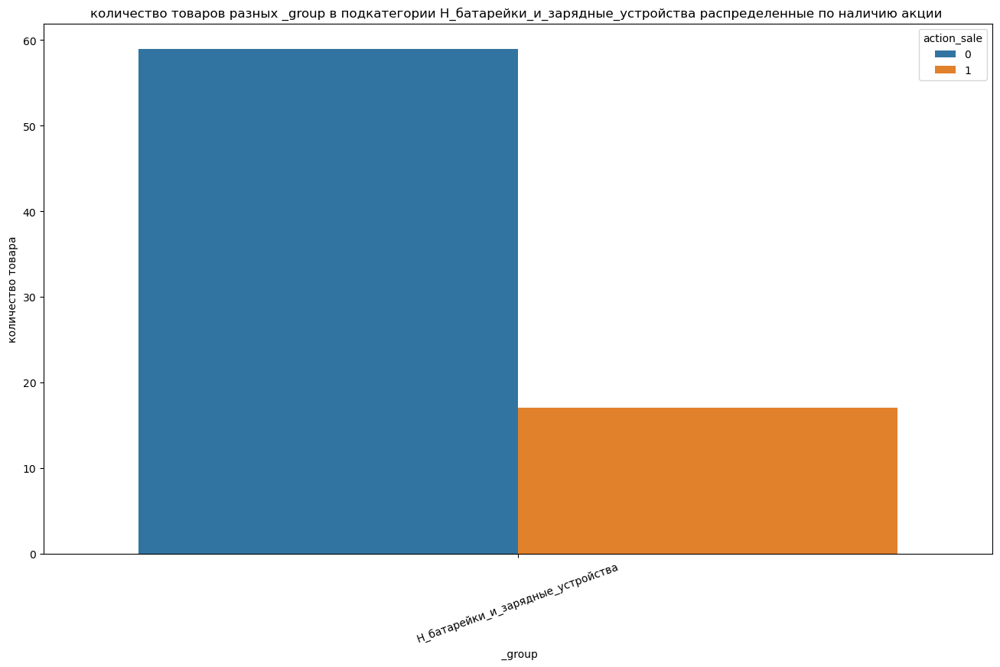

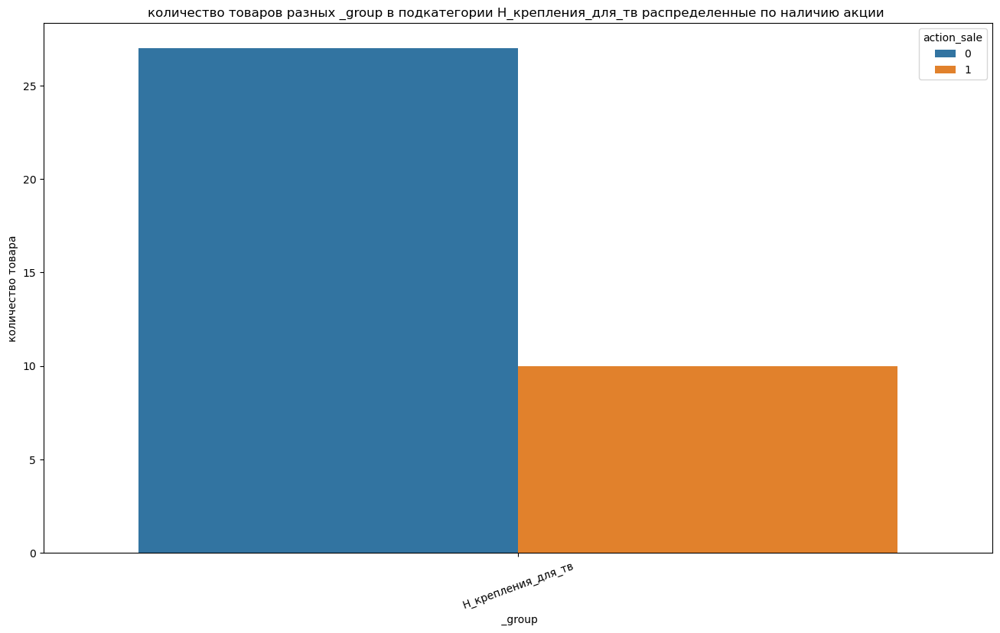

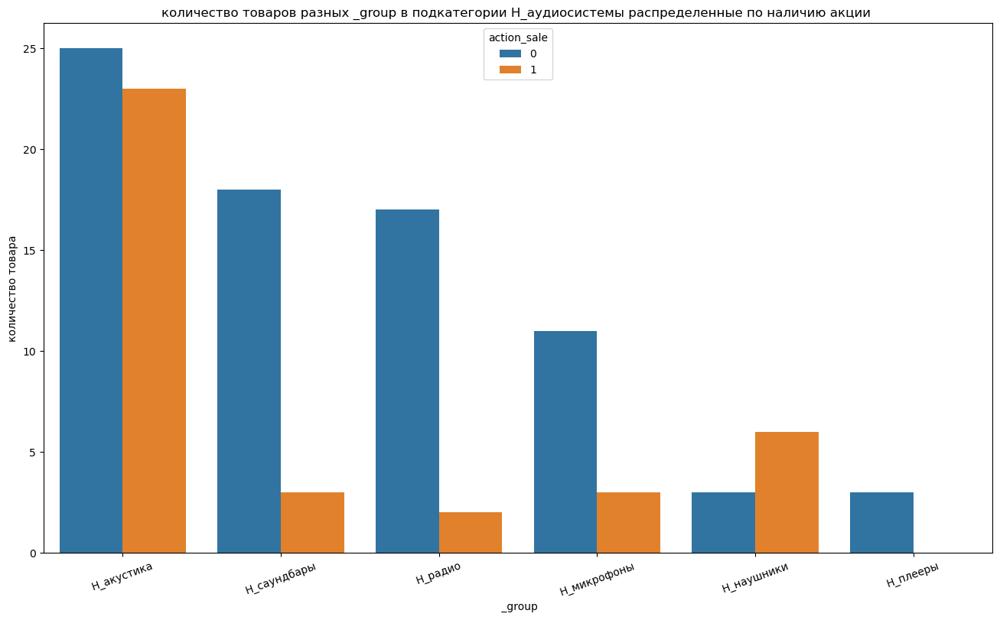

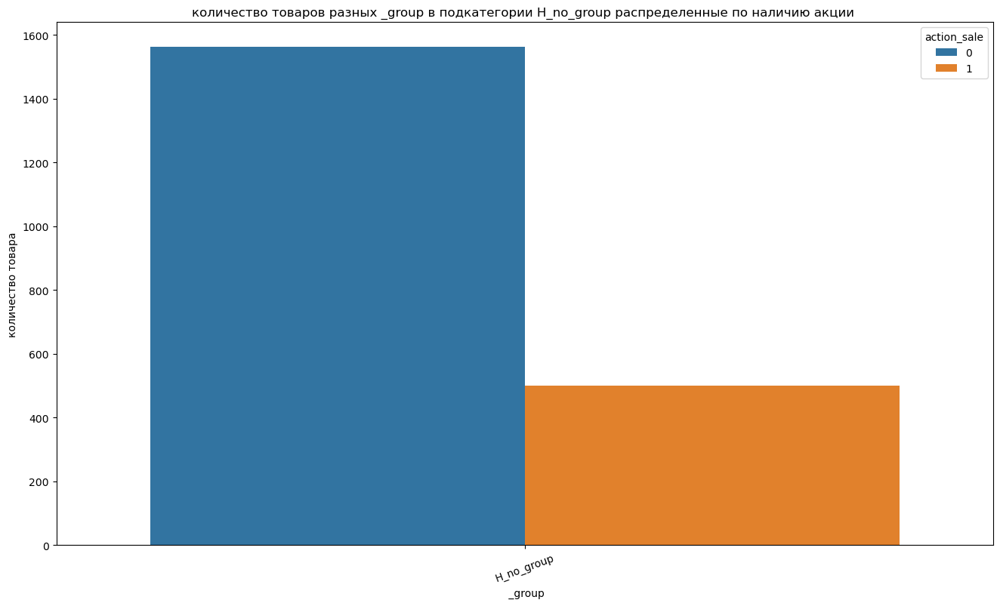

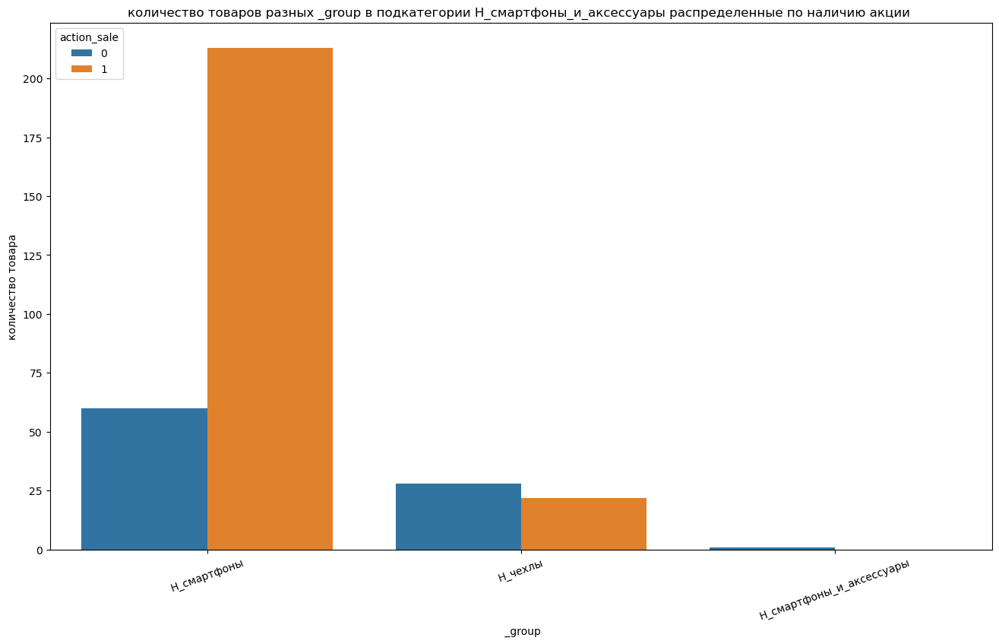

...

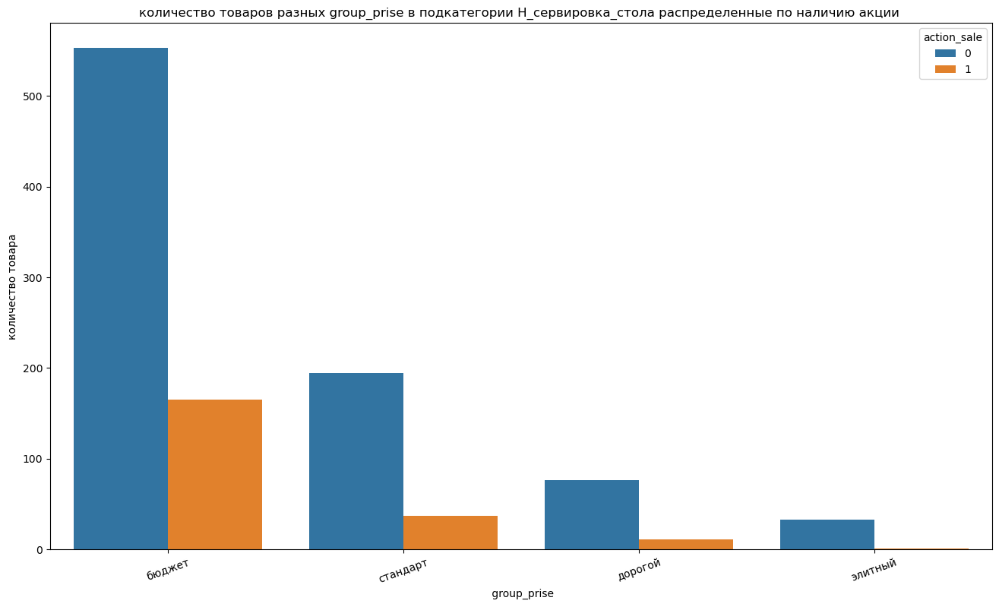

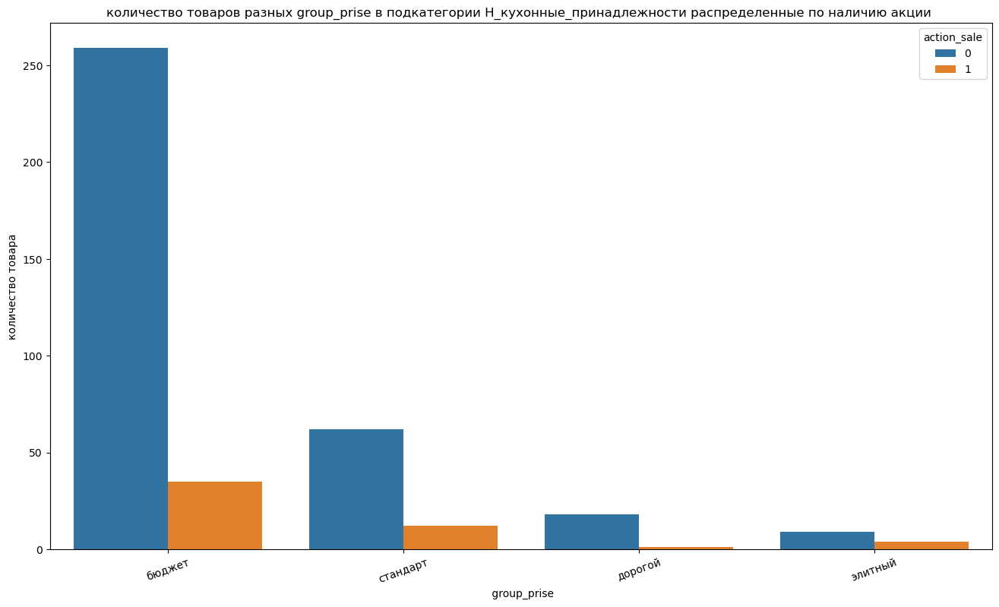

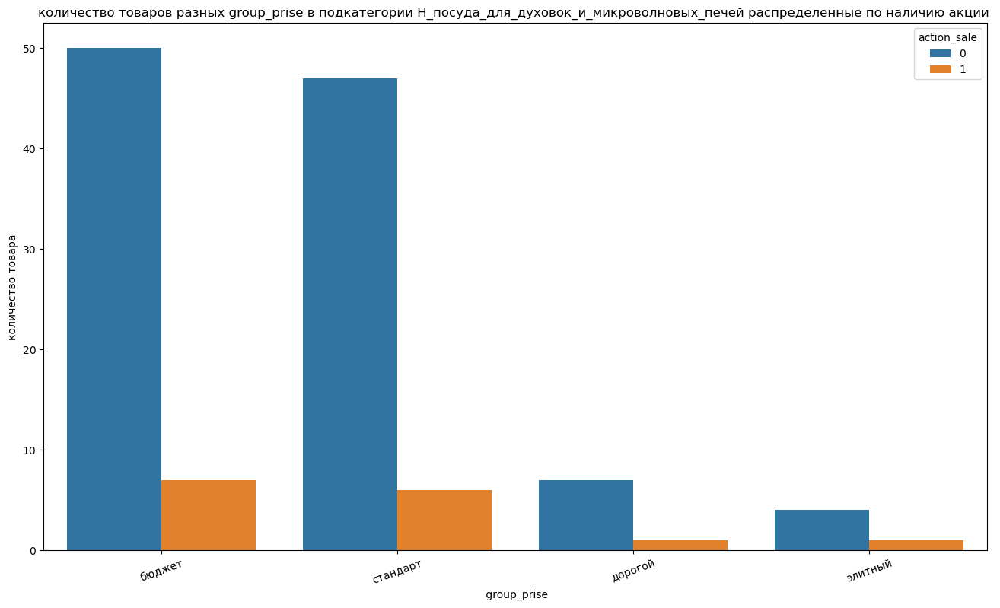

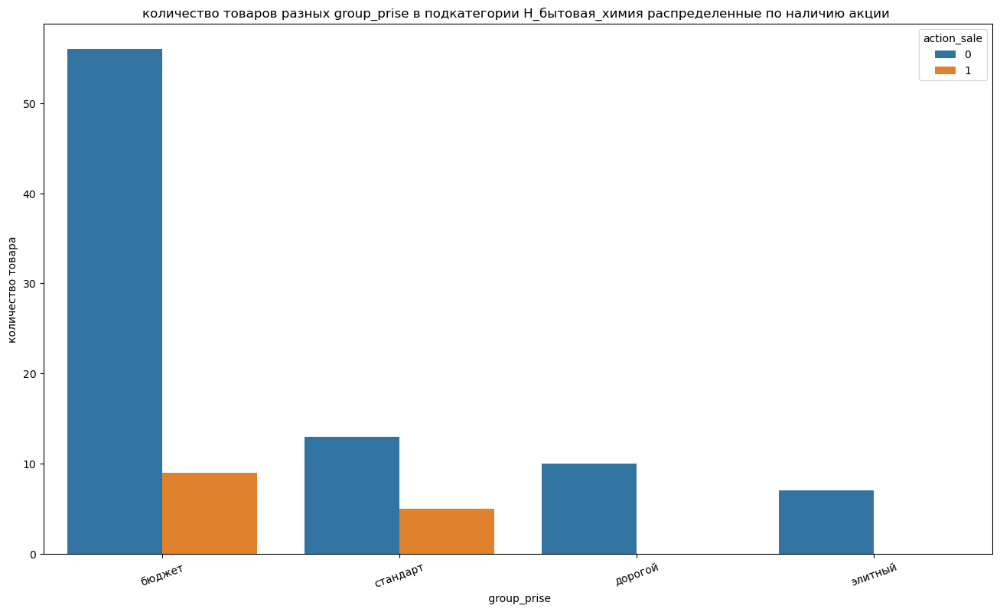

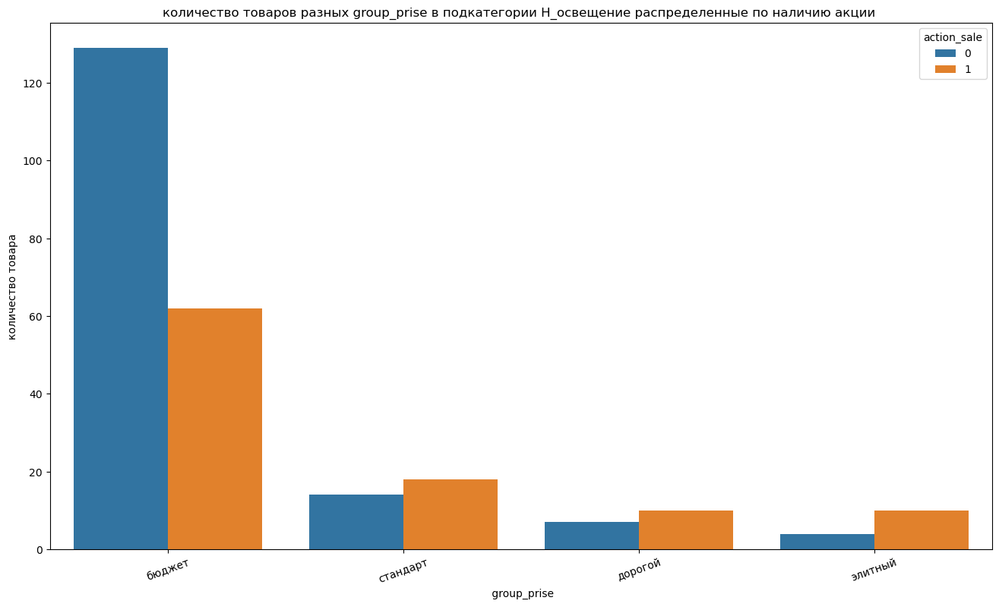

In [61]:
for x in separator:
    for i in df['_subcategory'].unique():        
        plt.figure(figsize=(16,9))
        sns.barplot(df[df['_subcategory']==i].groupby([x ,'action_sale'])['id'].count().sort_values(ascending=False).reset_index(),
                       x=x, y='id', hue='action_sale')
        plt.xticks(rotation=20)
        plt.title(f'количество товаров разных {x} в подкатегории {i} распределенные по наличию акции ')
        plt.xlabel(f' {x}')
        plt.ylabel('количество товара')
        plt.show()

In [62]:
df[df['_subcategory']=='пылесосы_и_аксессуары'].groupby(['_group' ])['action_sale'].mean().reset_index()

,_group,action_sale


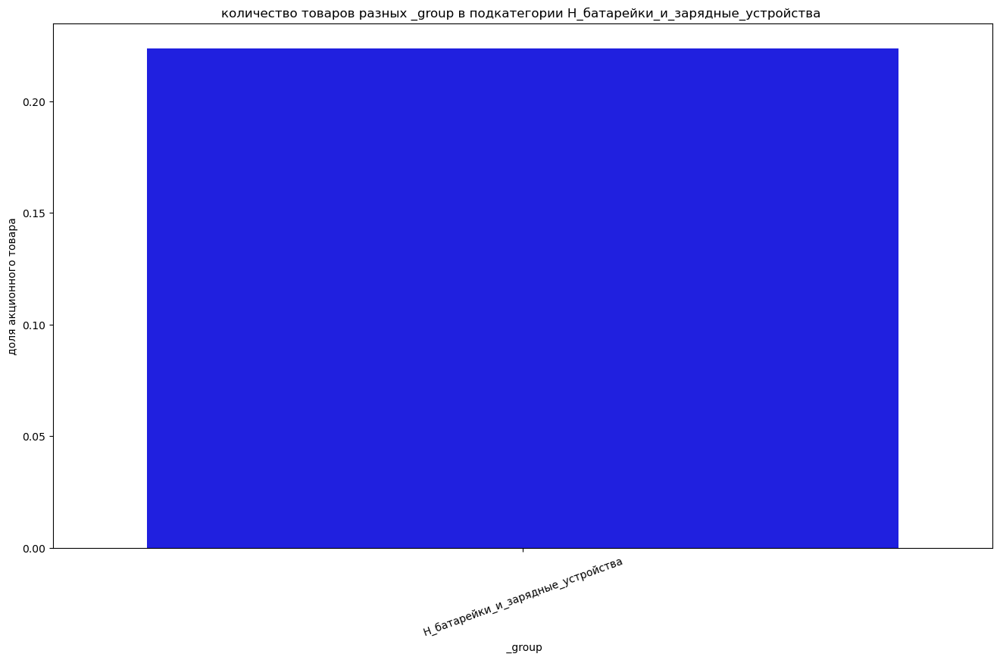

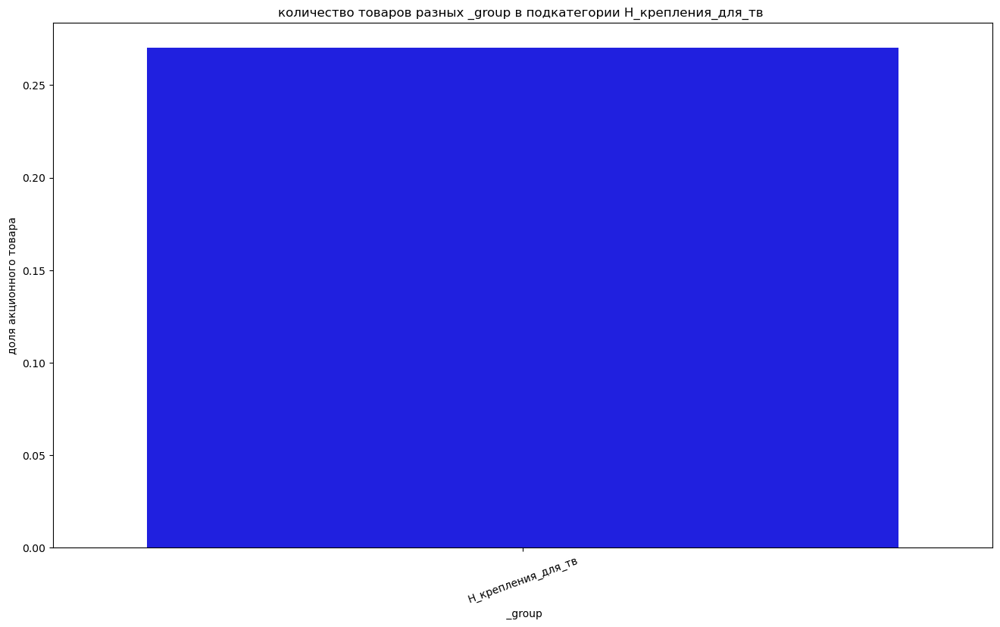

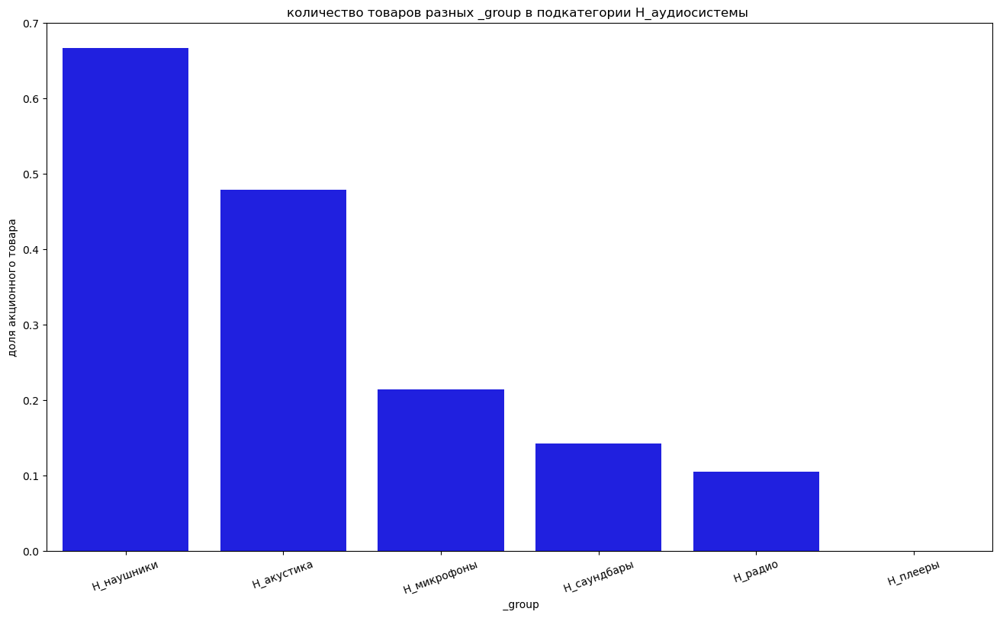

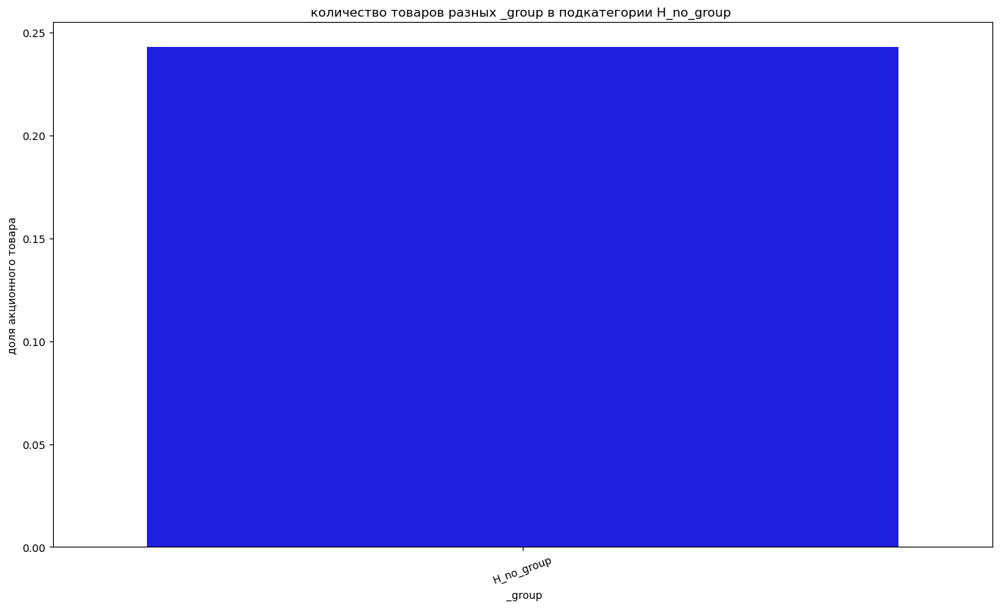

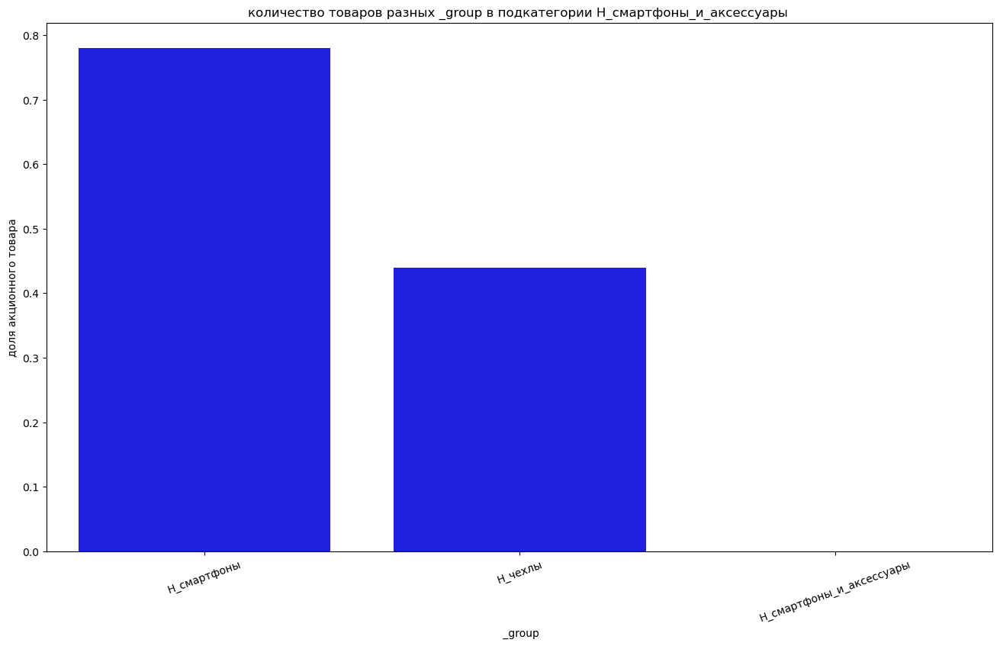

...

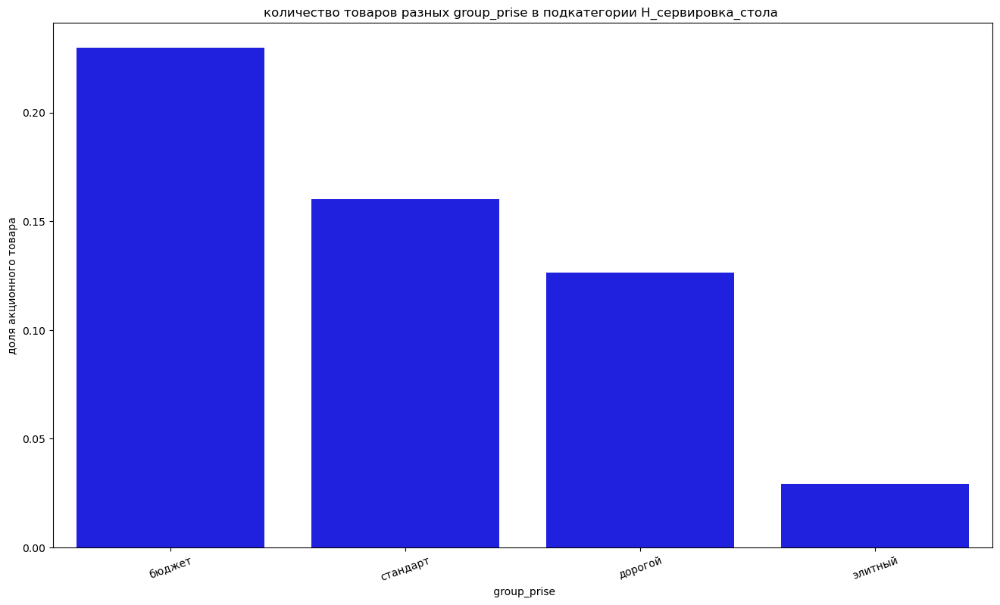

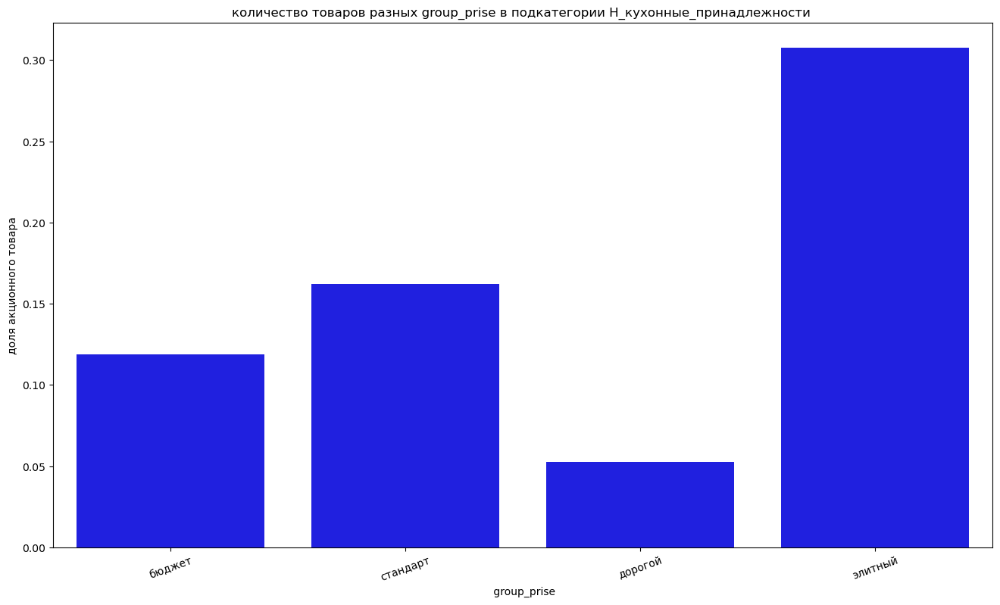

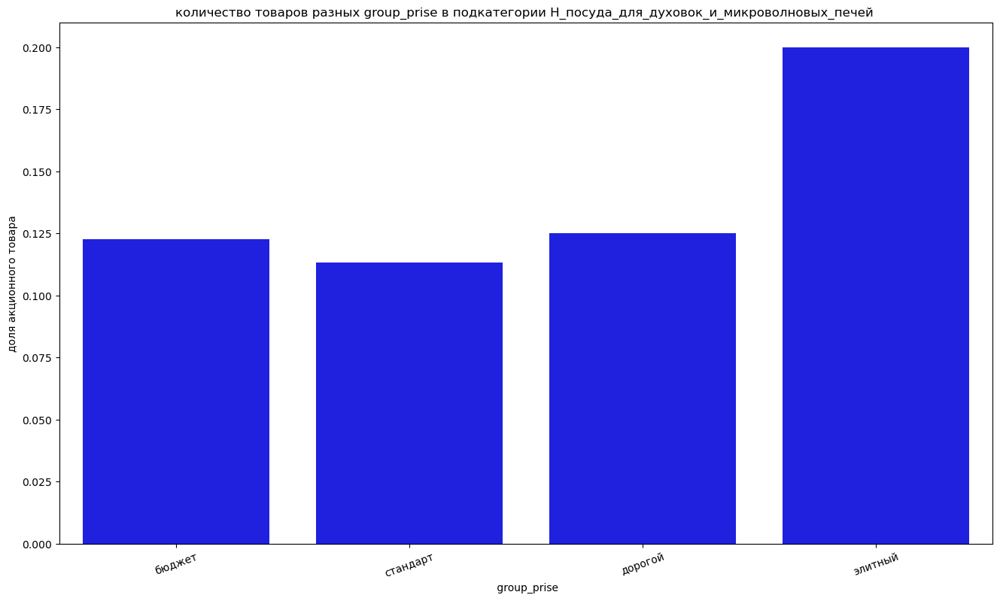

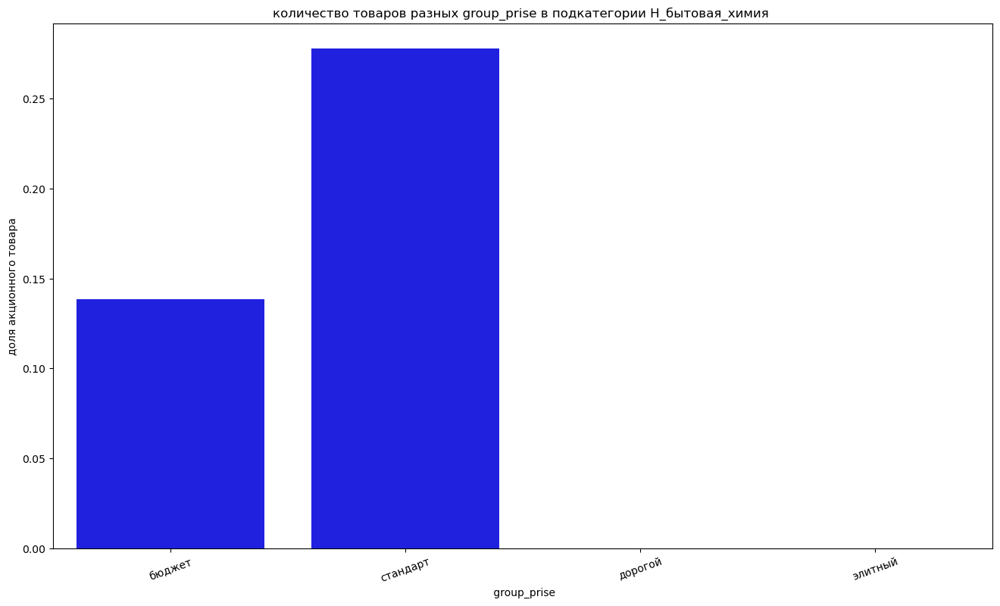

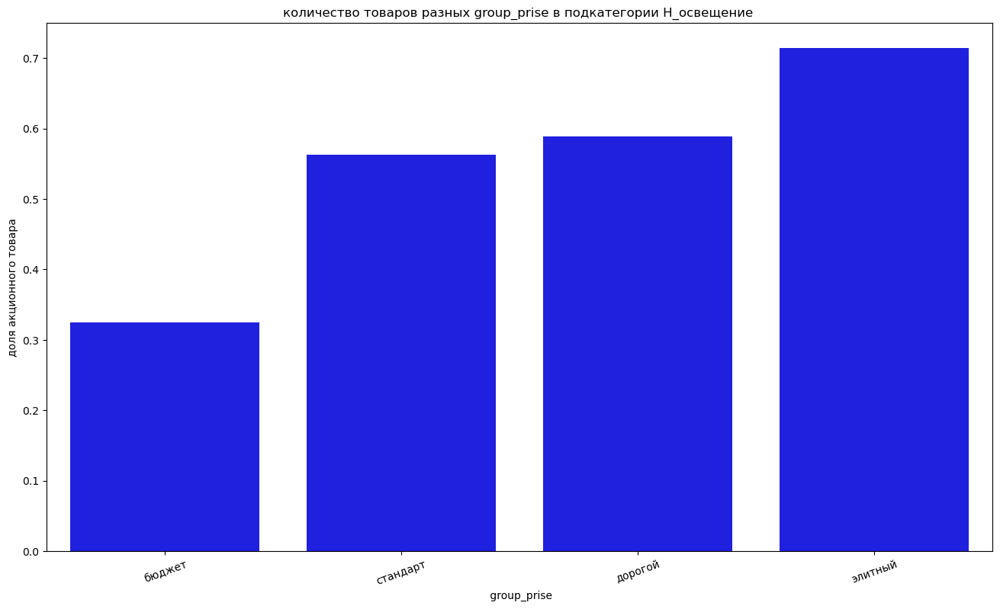

In [63]:
for x in separator:
    for i in df['_subcategory'].unique():        
        plt.figure(figsize=(16,9))
        sns.barplot(df[df['_subcategory']==i].groupby(x)['action_sale'].mean().sort_values(ascending=False).reset_index(),
                       x=x, y='action_sale', color='blue')
        plt.xticks(rotation=20)
        plt.title(f'количество товаров разных {x} в подкатегории {i} ')
        plt.xlabel(f' {x}')
        plt.ylabel('доля акционного товара')
        plt.show()